In [ ]:
# ================================================
# 🔹 1. Установка библиотек
# ================================================
!pip install torch torchvision kaggle tqdm matplotlib --quiet

# ================================================
# 🔹 2. Загрузка ключа Kaggle API
# ================================================
# Загрузи файл kaggle.json через интерфейс Colab (слева — 📁 → Upload)
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# ================================================
# 🔹 3. Скачивание и распаковка датасета PlantVillage
# ================================================
!kaggle datasets download -d emmarex/plantdisease -p ./data
!unzip -q ./data/plantdisease.zip -d ./data/plantvillage

Dataset URL: https://www.kaggle.com/datasets/emmarex/plantdisease
License(s): unknown
 97% 636M/658M [00:10<00:00, 74.3MB/s]
100% 658M/658M [00:10<00:00, 62.9MB/s]


In [ ]:
import os, shutil

SRC_DIR = "./data/plantvillage"
DST_DIR = "./data/binary_dataset"
os.makedirs(DST_DIR, exist_ok=True)

# Попробуем определить, где именно лежат классы (на каком уровне)
possible_subdirs = [os.path.join(SRC_DIR, d) for d in os.listdir(SRC_DIR)]
class_root = None
for d in possible_subdirs:
    if os.path.isdir(d) and len(os.listdir(d)) > 0:
        # ищем папку, где встречаются названия классов, вроде Tomato_...
        if any("Tomato" in s or "Apple" in s for s in os.listdir(d)):
            class_root = d
            break
if class_root is None:
    class_root = SRC_DIR

print("📂 Используется папка с классами:", class_root)

healthy_dir = os.path.join(DST_DIR, "healthy")
diseased_dir = os.path.join(DST_DIR, "diseased")
os.makedirs(healthy_dir, exist_ok=True)
os.makedirs(diseased_dir, exist_ok=True)

for class_name in os.listdir(class_root):
    class_path = os.path.join(class_root, class_name)
    if not os.path.isdir(class_path):
        continue

    target = healthy_dir if "healthy" in class_name.lower() else diseased_dir

    for img_name in os.listdir(class_path):
        src_img = os.path.join(class_path, img_name)
        if os.path.isdir(src_img):
            continue  # пропускаем случайные подпапки
        dst_img = os.path.join(target, f"{class_name}_{img_name}")
        shutil.copy(src_img, dst_img)

print("✅ Бинарный датасет готов:")
print(f"Healthy: {len(os.listdir(healthy_dir))} изображений")
print(f"Diseased: {len(os.listdir(diseased_dir))} изображений")

# ================================================
# 🔹 5. Импорт библиотек PyTorch
# ================================================
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import numpy as np

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("💻 Используется устройство:", DEVICE)

📂 Используется папка с классами: ./data/plantvillage/PlantVillage
✅ Бинарный датасет готов:
Healthy: 3221 изображений
Diseased: 17418 изображений
💻 Используется устройство: cuda


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 143MB/s]



🔄 Epoch 1/5


Training:   0%|          | 0/516 [00:00<?, ?it/s]

Validating:   0%|          | 0/129 [00:00<?, ?it/s]

✅ Train Loss: 0.1472, Acc: 94.29% | Val Loss: 0.0894, Acc: 96.56%

🔄 Epoch 2/5


Training:   0%|          | 0/516 [00:00<?, ?it/s]

Validating:   0%|          | 0/129 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b8b785258a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b8b785258a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

✅ Train Loss: 0.0769, Acc: 97.27% | Val Loss: 0.0762, Acc: 97.09%

🔄 Epoch 3/5


Training:   0%|          | 0/516 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b8b785258a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7b8b785258a0>if w.is_alive():Exception ignored in: 

<function _MultiProcessingDataLoaderIter.__del__ at 0x7b8b785258a0>Traceback (most recent call last):
 
Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1664, in __del__
          self._shutdown_workers() 
Exception ignored in: self._shutdown_workers()  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/data

Validating:   0%|          | 0/129 [00:00<?, ?it/s]

✅ Train Loss: 0.0644, Acc: 97.66% | Val Loss: 0.0623, Acc: 98.06%

🔄 Epoch 4/5


Training:   0%|          | 0/516 [00:00<?, ?it/s]

Validating:   0%|          | 0/129 [00:00<?, ?it/s]

✅ Train Loss: 0.0572, Acc: 97.95% | Val Loss: 0.0478, Acc: 98.35%

🔄 Epoch 5/5


Training:   0%|          | 0/516 [00:00<?, ?it/s]

Validating:   0%|          | 0/129 [00:00<?, ?it/s]

✅ Train Loss: 0.0550, Acc: 97.95% | Val Loss: 0.0473, Acc: 98.38%


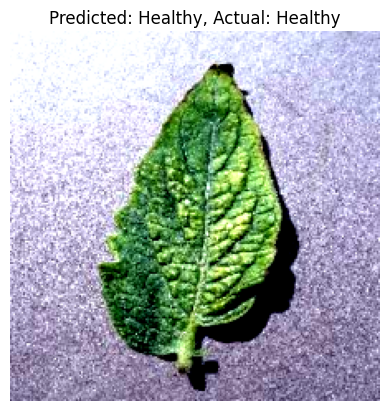

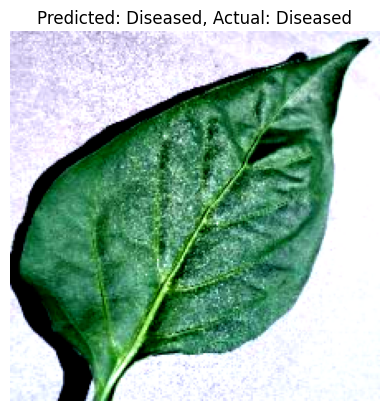

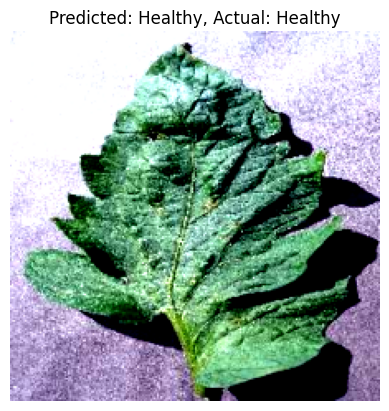

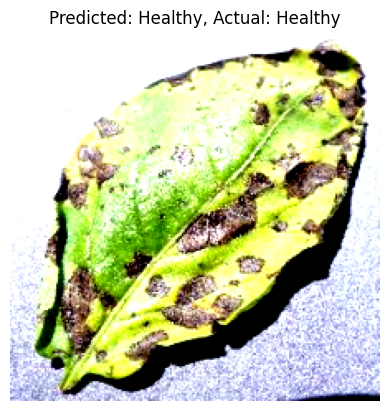

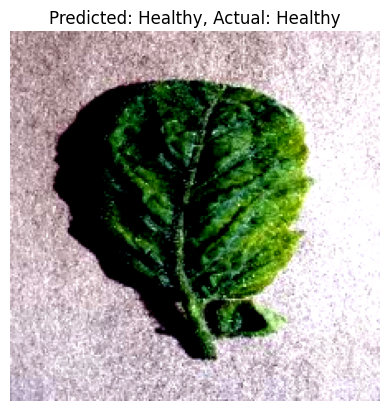

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(DST_DIR, transform=transform)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2, pin_memory=True)

NUM_CLASSES = 2

# ================================================
# 🔹 7. Инициализация модели (ResNet18)
# ================================================
model = models.resnet18(pretrained=True)
for param in model.parameters():
    param.requires_grad = False  # заморозим сверточные слои

model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
model = model.to(DEVICE)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.fc.parameters(), lr=0.001)

# ================================================
# 🔹 8. Обучение модели
# ================================================
EPOCHS = 5
torch.backends.cudnn.benchmark = True

for epoch in range(EPOCHS):
    print(f"\n🔄 Epoch {epoch+1}/{EPOCHS}")
    model.train()
    running_loss, correct, total = 0, 0, 0

    for inputs, labels in tqdm(train_loader, desc="Training", leave=False):
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        total += labels.size(0)
        correct += preds.eq(labels).sum().item()

    train_loss = running_loss / len(train_dataset)
    train_acc = 100. * correct / total

    # Валидация
    model.eval()
    val_loss, val_correct = 0, 0
    with torch.no_grad():
        for inputs, labels in tqdm(val_loader, desc="Validating", leave=False):
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            val_correct += preds.eq(labels).sum().item()

    val_loss /= len(val_dataset)
    val_acc = 100. * val_correct / len(val_dataset)
    print(f"✅ Train Loss: {train_loss:.4f}, Acc: {train_acc:.2f}% | "
          f"Val Loss: {val_loss:.4f}, Acc: {val_acc:.2f}%")

# ================================================
# 🔹 9. Визуализация предсказаний
# ================================================
def imshow(img, title):
    img = img / 2 + 0.5
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title(title)
    plt.axis('off')
    plt.show()

labels_map = {0: "Healthy", 1: "Diseased"}

dataiter = iter(val_loader)
images, labels = next(dataiter)
outputs = model(images.to(DEVICE))
_, preds = torch.max(outputs, 1)

for i in range(5):
    pred_label = labels_map[preds[i].item()]
    actual_label = labels_map[labels[i].item()]
    imshow(images[i].cpu(), f"Predicted: {pred_label}, Actual: {actual_label}")

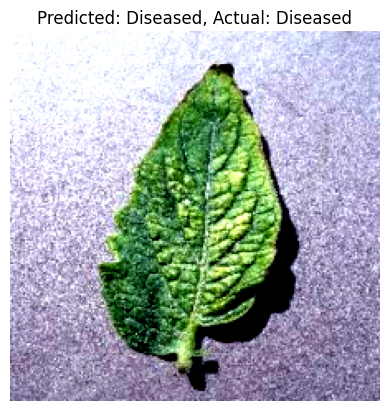

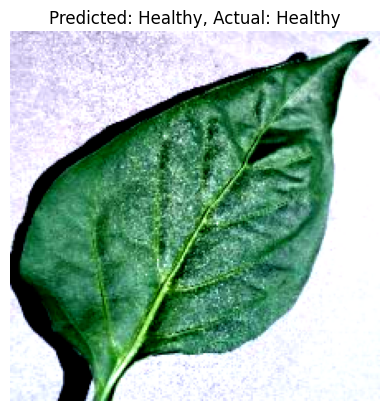

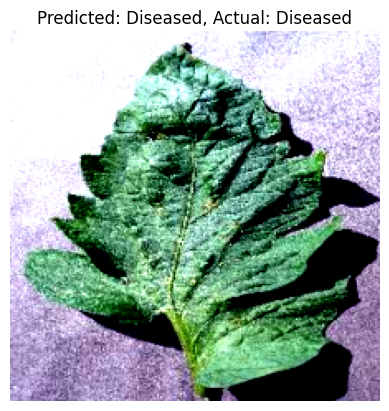

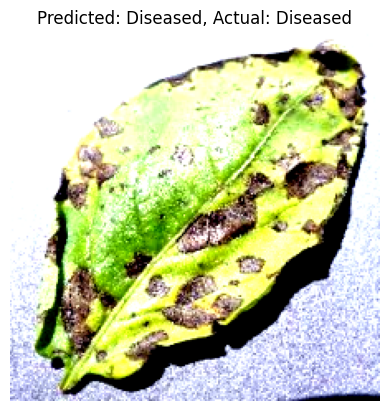

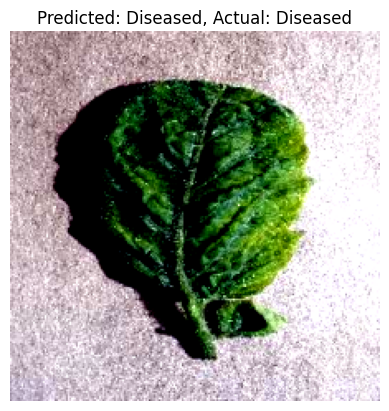

...

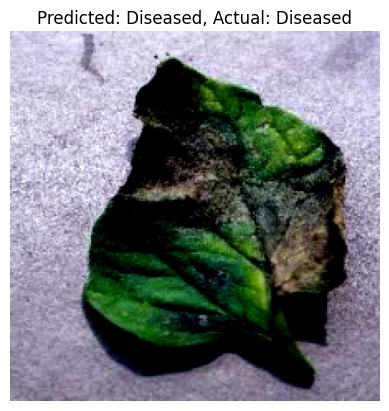

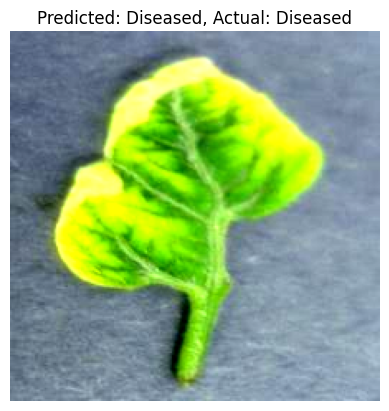

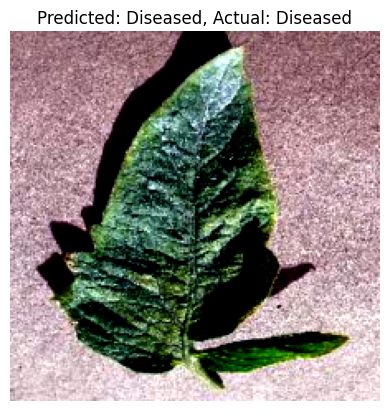

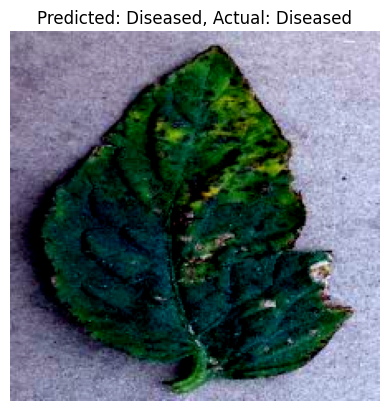

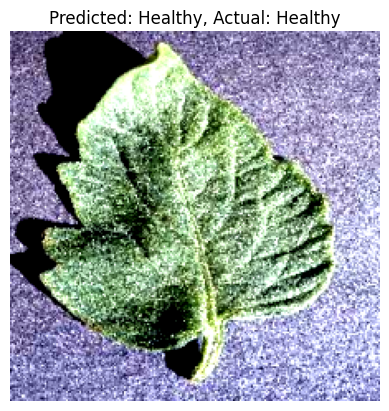

In [ ]:
# ЗДЕСЬ ПРАВИЛЬНЫЕ ФОТКИ!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
# 🔹 9. Визуализация предсказаний с корректными метками
def imshow(img, title):
    img = img / 2 + 0.5  # денормализация
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title(title)
    plt.axis('off')
    plt.show()

# Создаём правильное отображение индексов в названия классов
labels_map = {v: k for k, v in dataset.class_to_idx.items()}  # {0: 'diseased', 1: 'healthy'}

dataiter = iter(val_loader)
images, labels = next(dataiter)
outputs = model(images.to(DEVICE))
_, preds = torch.max(outputs, 1)

for i in range(25):
    pred_label = labels_map[preds[i].item()].capitalize()
    actual_label = labels_map[labels[i].item()].capitalize()
    imshow(images[i].cpu(), f"Predicted: {pred_label}, Actual: {actual_label}")
